Calculate the Bayes Factor for $g-r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'NSA_v1_0_1_VAGC_vflag-V2-VF_updated.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
gr_NSA = np.array(catalog_main['g_r'])

## Separate galaxies by their LSS classifications

### $V^2$

In [6]:
wall_v2 = catalog_main['vflag_V2'] == 0
void_v2 = catalog_main['vflag_V2'] == 1
edge_v2 = catalog_main['vflag_V2'] == 2
out_v2 = catalog_main['vflag_V2'] == 9

### VoidFinder

In [6]:
wall_vf = catalog_main['vflag_VF'] == 0
void_vf = catalog_main['vflag_VF'] == 1
edge_vf = catalog_main['vflag_VF'] == 2
out_vf = catalog_main['vflag_VF'] == 9

In [7]:
del catalog_main, catalog_north, data

# Fit the color distributions with skewnormal distributions

Both one- and two-parent models

This is a bimodal distribution

In [8]:
gr_bins = np.arange(0, 1.25, 0.02)

In [9]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

labels1_tri = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                    'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$', 
                    'c', r'$\mu_c$', r'$\sigma_c$', 'skew$_c$']
labels2_tri = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
               '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
               '$c_2$', r'$\mu_{1c}$', r'$\sigma_{1c}$', 'skew$_{1c}$', 
               '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
               '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$', 
               '$c_2$', r'$\mu_{2c}$', r'$\sigma_{2c}$', 'skew$_{2c}$']

## V$^2$

### 1-parent model

In [16]:
temp_infile = open('pocoMC_results/sampler_results_M1_g-r_V2.pickle', 'rb')
V2_results1 = pickle.load(temp_infile)
temp_infile.close()

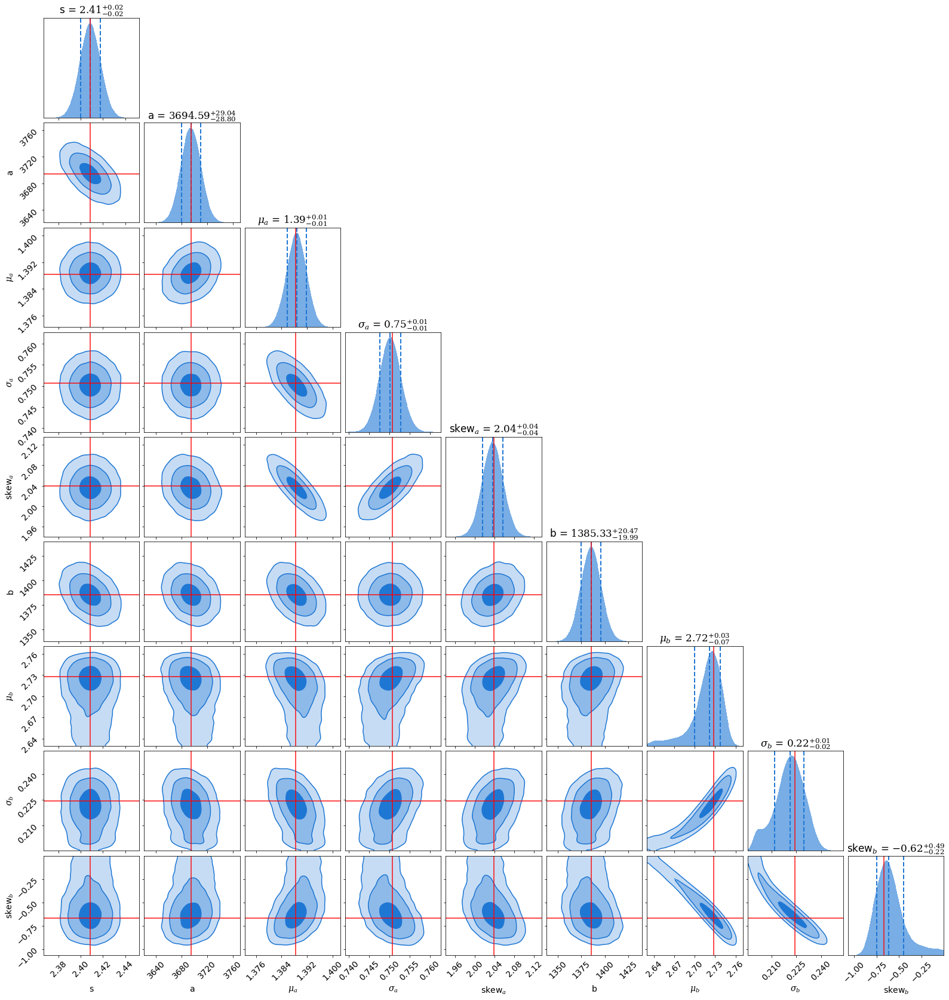

In [18]:
pc.plotting.corner(V2_results1, 
                   labels=labels1_tri, 
                   dims=range(len(labels1_tri)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [20]:
lnzM1_V2 = V2_results1['logz'][-1]
lnzM1_V2

-1303.1681428575446

In [22]:
V2_gr_bestfit1 = np.mean(V2_results1['samples'], axis=0)

V2_gr_bestfit1

array([ 2.40867498e+00,  3.69464498e+03,  1.38872933e+00,  7.50215457e-01,
        2.03631353e+00,  1.38532614e+03,  2.71754760e+00,  2.20666663e-01,
       -5.91662197e-01])

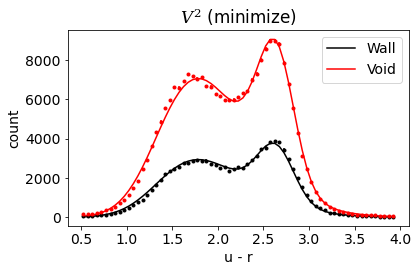

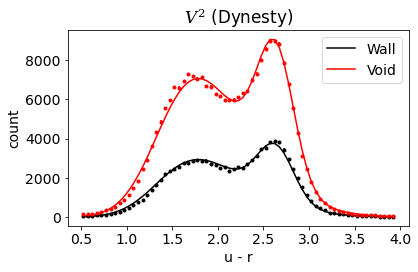

In [23]:
Model_1_plot(V2_gr_bestfit1, 
             gr_NSA[wall_v2], 
             gr_NSA[void_v2], 
             gr_bins, 
             3, 
             xlabel_text='g - r', 
             title_text=r'$V^2$ $\mathcal{M}_1$ (pocoMC)')

### 2-parent model

In [25]:
temp_infile = open('pocoMC_results/sampler_results_M2_g-r_V2.pickle', 'rb')
V2_results2 = pickle.load(temp_infile)
temp_infile.close()

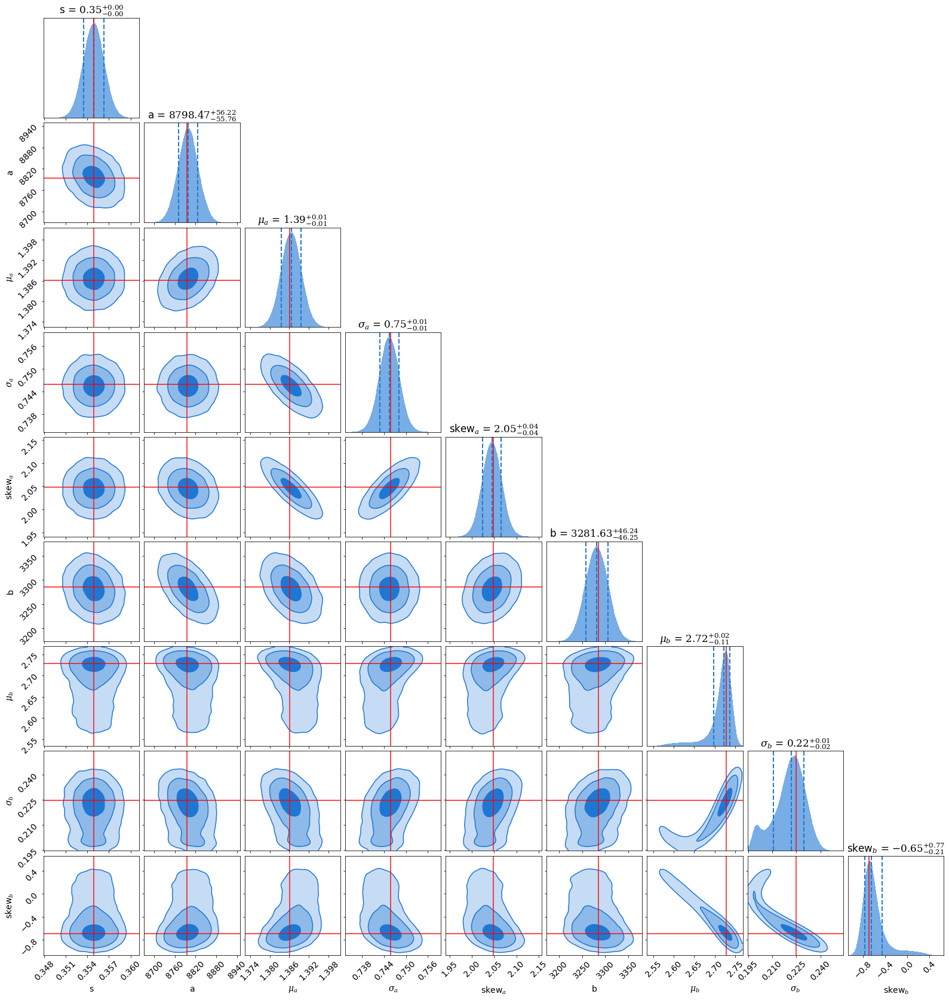

In [26]:
pc.plotting.corner(V2_results2, 
                   labels=labels2_tri, 
                   dims=range(len(labels2_tri)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [27]:
lnzM2_V2 = V2_results2['logz'][-1]
lnzM1_V2

-4822.731347962

In [28]:
V2_ur_bestfit2 = np.mean(V2_results2['samples'], axis=0)

V2_ur_bestfit2

array([ 3.54884306e-01,  8.79849117e+03,  1.38657647e+00,  7.45464859e-01,
        2.04513391e+00,  3.28171488e+03,  2.71433372e+00,  2.20574396e-01,
       -5.93174341e-01])

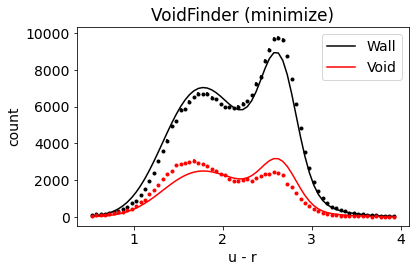

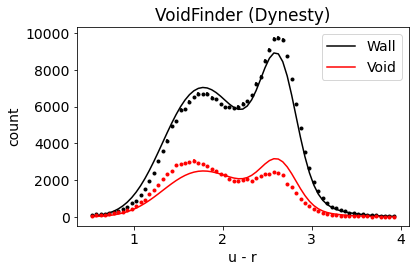

In [29]:
Model_2_plot(V2_gr_bestfit2, 
             gr_NSA[wall_vf], 
             gr_NSA[void_vf], 
             gr_bins, 
             3, 
             xlabel_text='g - r', 
             title_text=r'$V$^2$ $\mathcal{M}_2$ (pocoMC)')

### Calculate Bayes factor

In [10]:
lnB12_V2 = lnzM1_V2 - lnzM2_V2

B12_V2 = np.exp(lnB12_V2)

print('V2 u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2, lnB12_V2*np.log10(np.exp(1))))

NameError: name 'lnzM1_V2' is not defined

## VoidFinder

### 1-parent model

In [12]:
temp_infile = open('pocoMC_results/sampler_results_M1_g-r_VoidFinder.pickle', 'rb')
VF_results1 = pickle.load(temp_infile)
temp_infile.close()

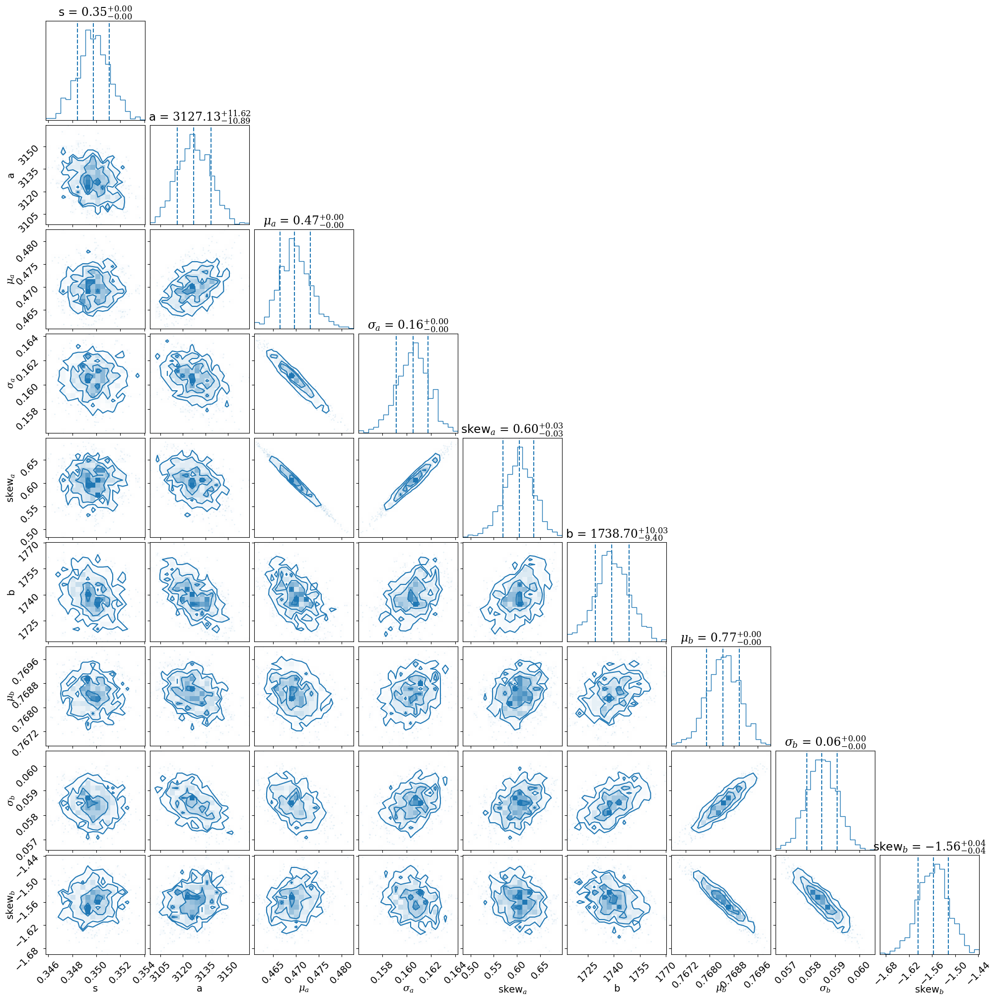

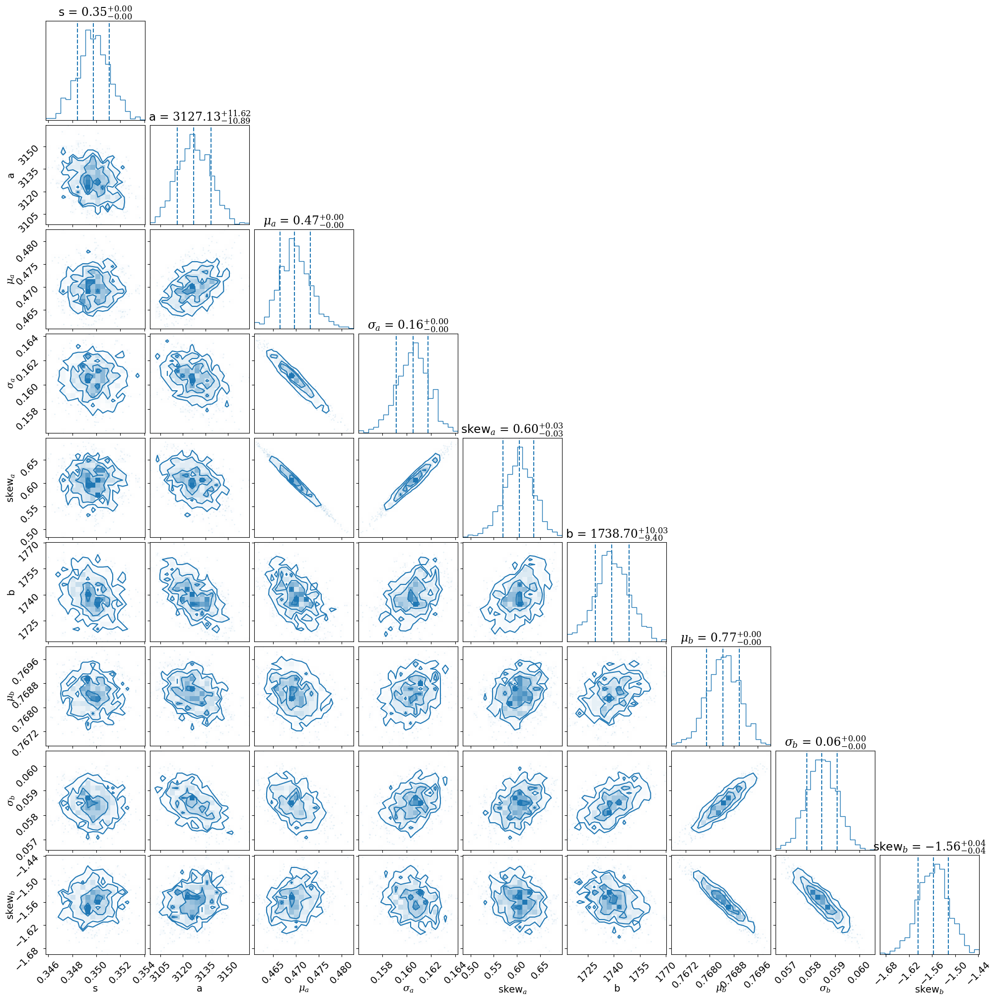

In [13]:
pc.plotting.corner(VF_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [14]:
lnzM1_VF = VF_results1['logz'][-1]
lnzM1_VF

-5760.602036831154

In [15]:
VF_bestfit1 = np.mean(VF_results1['samples'], axis=0)

VF_bestfit1

array([ 3.4973884e-01,  3.1273804e+03,  4.6984893e-01,  1.6049172e-01,
        6.0289454e-01,  1.7391008e+03,  7.6844108e-01,  5.8454111e-02,
       -1.5568280e+00], dtype=float32)

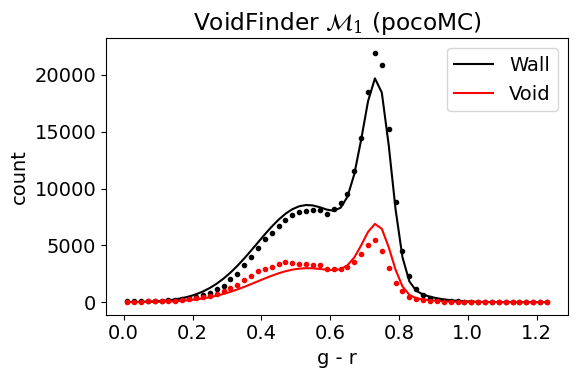

In [18]:
Model_1_plot(VF_bestfit1, 
             gr_NSA[wall_vf], 
             gr_NSA[void_vf], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'VoidFinder $\mathcal{M}_1$ (pocoMC)')

### 2-parent model

In [19]:
temp_infile = open('pocoMC_results/sampler_results_M2_g-r_VoidFinder.pickle', 'rb')
VF_results2 = pickle.load(temp_infile)
temp_infile.close()

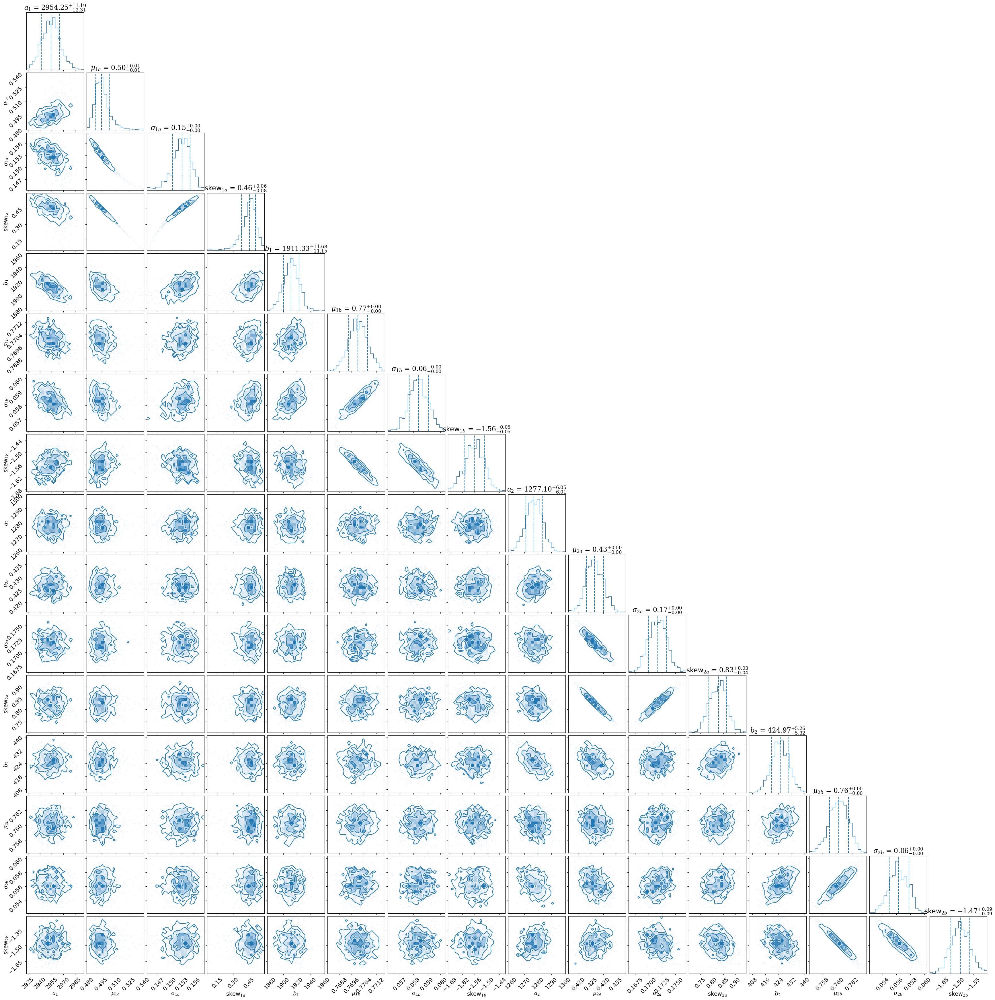

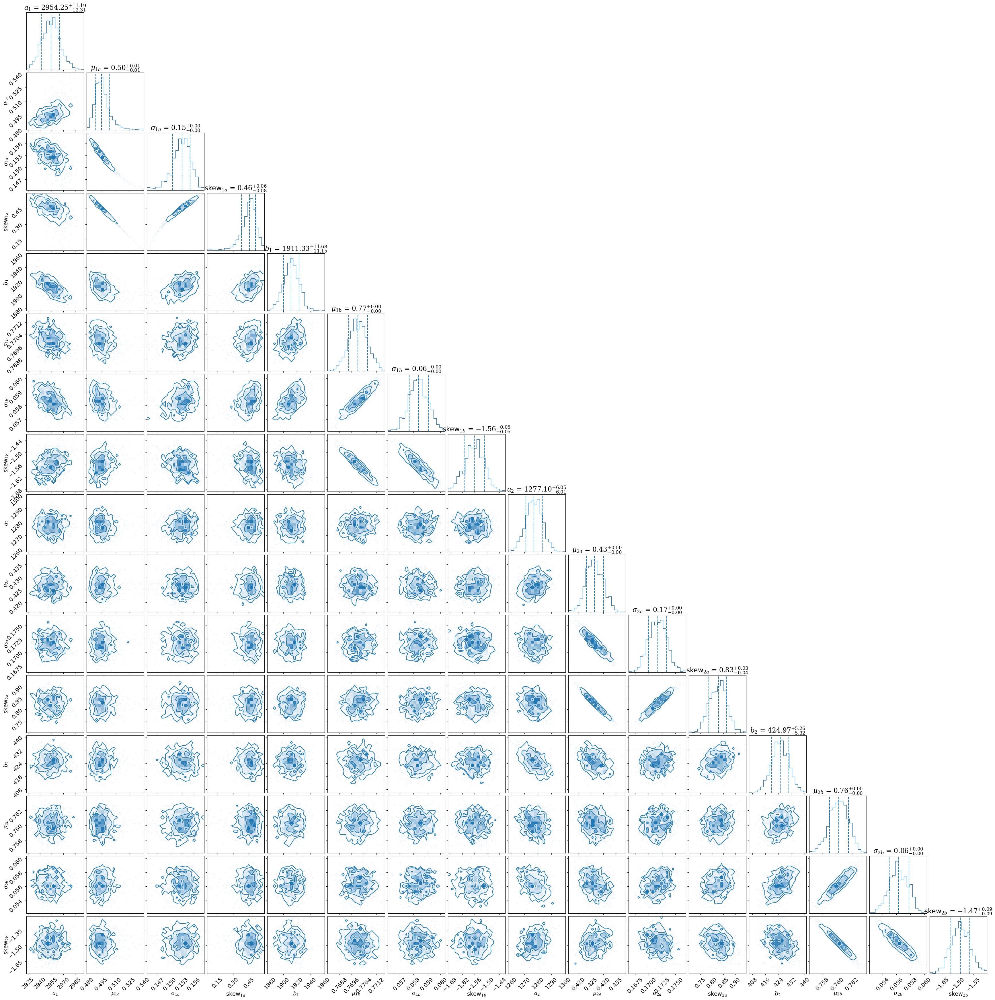

In [20]:
pc.plotting.corner(VF_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [21]:
lnzM2_VF = VF_results2['logz'][-1]
lnzM2_VF

-1835.0087963637811

In [22]:
VF_bestfit2 = np.mean(VF_results2['samples'], axis=0)

VF_bestfit2

array([ 2.9541990e+03,  4.9682638e-01,  1.5286262e-01,  4.4335708e-01,
        1.9114392e+03,  7.7001756e-01,  5.8370277e-02, -1.5619717e+00,
        1.2770878e+03,  4.2658138e-01,  1.7168708e-01,  8.2599175e-01,
        4.2495074e+02,  7.6022881e-01,  5.6304716e-02, -1.4719926e+00],
      dtype=float32)

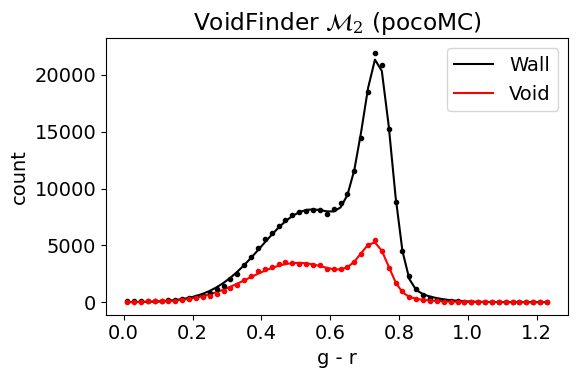

In [23]:
Model_2_plot(VF_bestfit2, 
             gr_NSA[wall_vf], 
             gr_NSA[void_vf], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'VoidFinder $\mathcal{M}_2$ (pocoMC)')

### Bayes Factor

In [24]:
lnB12_VF = lnzM1_VF - lnzM2_VF

B12_VF = np.exp(lnB12_VF)

print('VoidFinder g-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_VF, lnB12_VF*np.log10(np.exp(1))))

VoidFinder g-r: B12 = 0; log(B12) = -1704.863


So both VoidFinder and V$^2$ favor $\mathcal{M}_2$, in which the two data sets come from different parent distributions, although VoidFinder favors it much more than V$^2$.